In [52]:
import numpy as np
import matplotlib.pyplot as plt
import sys, os, glob, re
import sklearn
%matplotlib inline  

## Get Data

In [2]:
snid_dir = '/home/data/mew488/Desktop/NYU/Research/Maryam/allSNIDtemp/'
all_spec = os.listdir(snid_dir)

In [3]:
# Get List of spectra files that are type Ib or Ic

# For some reason, these files do not have a standard organization, which makes it
# stupidly aggravating to load them all. Here we search for spectra of type Ib or Ic
# and find the line number where the wavelength 2501.69 appears (this is the first).
Ib_Ic = []
skiprows = []
for spec_name in all_spec:
    path = snid_dir + spec_name
    with open(path, 'r') as f:
        lines = f.readlines()
        header = lines[0].split()
        SN_type = int(header[-2])
        if ((SN_type == 2) or (SN_type == 3)): 
            Ib_Ic.append(path)
            #the first observed wavelength is always 2501.69
            first_wvl = '2501.69'
            for i in range(len(lines)-1):
                line = lines[i]
                if first_wvl in line:
                    skiprows.append(i)
                    break

In [9]:
print "There are %d type Ib and Ic SN"%(len(Ib_Ic))

There are 153 type Ib and Ic SN


In [48]:
# For each spectra, skip all the header lines about removing continuum and load the phase=0
# spectra into a numpy array. Do some data processing like filtering for desired wavelengths and 
# normalizing data.

spectra = []
for i in range(len(Ib_Ic)-1):
    spec = Ib_Ic[i]
    skiprow = skiprows[i]
    s = np.loadtxt(spec,skiprows=skiprow, usecols=(0,1))
    
    # check that first wvl is 2501.69
    if not(s[0][0] == 2501.69): print 'first wavelength is not 2501.69'
    
    # filter for desired wavelengths
    mask = np.logical_and(s[:,0]>4000, s[:,0]<7000)
    s = s[mask]
    
    # zero the mean
    s[:,1] = s[:,1] - np.mean(s[:,1])
    #normalize std
    s[:,1] = s[:,1]/np.std(s[:,1])
    spectra.append(s)

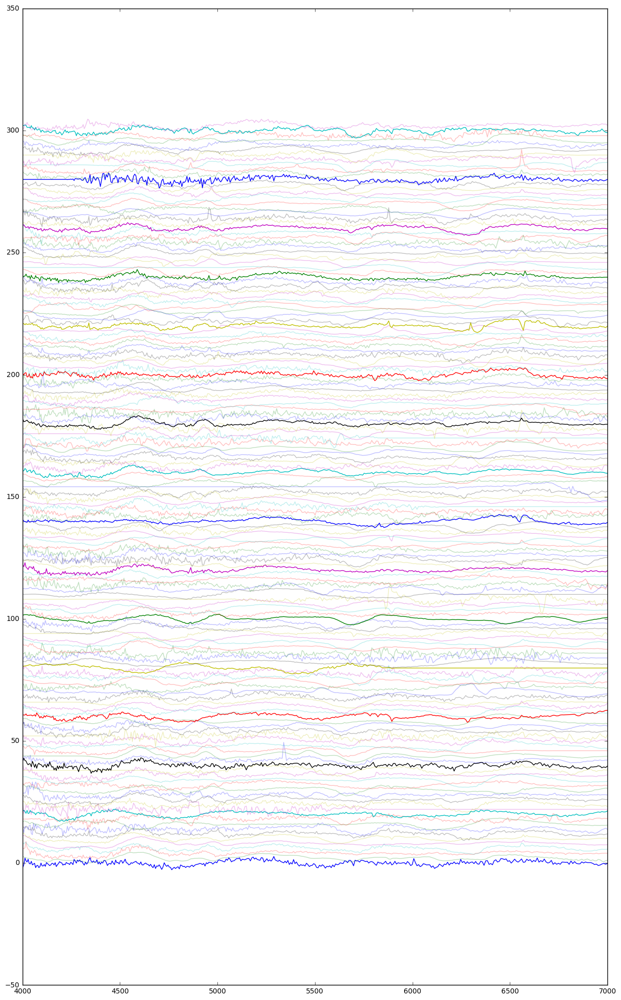

In [50]:
# Plot the spectra post data processing

plt.figure(figsize=(15,25))
for i,spec in enumerate(spectra):
    alpha=0.25
    if not i%10:
        alpha=1
    plt.plot(spec[:,0],spec[:,1]+i*2, alpha=alpha)

## PCA Decomposition

In [65]:
from sklearn.decomposition import PCA

spectra_matrix = np.ndarray((len(spectra), spectra[0].shape[0]))
for i in range(len(spectra)):
    spectra_matrix[i,:] = spectra[i][:,1]
    
wavelengths = spectra[0][:,0]

In [66]:
spectra_matrix.shape

(152, 414)

In [67]:
spectra_matrix

array([[-1.76101433, -0.56973993,  2.03782737, ..., -0.1461757 ,
        -0.50355802, -0.18588485],
       [ 0.69551933,  0.46312635,  0.27114955, ..., -1.52737002,
        -1.0221679 , -0.93123151],
       [ 2.20078374,  1.87039546,  2.24144691, ...,  0.01513819,
         0.05071847,  0.0049724 ],
       ..., 
       [ 0.00365168,  0.02556175,  0.18988728, ..., -0.0511235 ,
        -0.0511235 , -0.0511235 ],
       [ 2.06476138,  2.07710433,  2.31162044, ..., -0.13228426,
        -0.70006009, -0.77411781],
       [-0.88203027, -1.12301191,  0.81531869, ...,  0.62672436,
         0.66863422,  0.24953571]])

In [68]:
pca = PCA()

In [69]:
pca.fit(spectra_matrix)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [70]:
pca.components_

array([[-0.07057133, -0.06168983, -0.05760626, ..., -0.01477326,
        -0.01788038, -0.0157642 ],
       [ 0.01259199,  0.01681756,  0.01808239, ..., -0.00186244,
         0.00038485, -0.00369979],
       [ 0.08044267,  0.07720316,  0.07448027, ..., -0.06086746,
        -0.0620625 , -0.07030308],
       ..., 
       [-0.02831403,  0.04891982, -0.03531718, ...,  0.03176371,
         0.05103325, -0.06138995],
       [-0.04619617,  0.07968759,  0.04365738, ..., -0.0050257 ,
        -0.01896405,  0.01651966],
       [ 0.06558016, -0.04794879, -0.1406144 , ...,  0.0036337 ,
        -0.03238412,  0.02592564]])

In [71]:
pca.n_components_

414

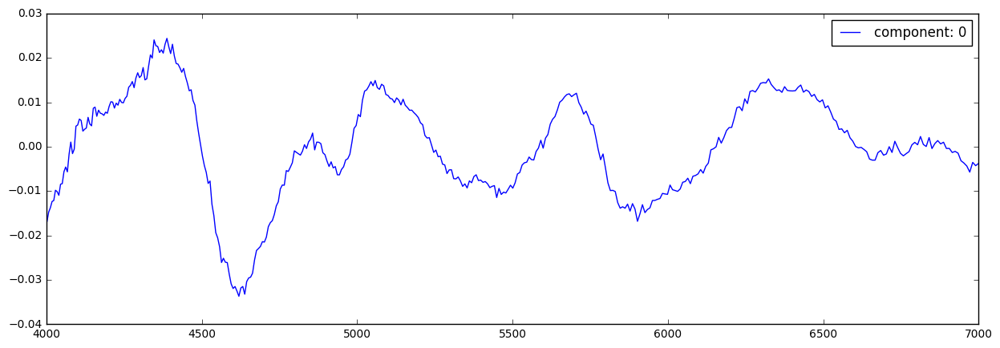

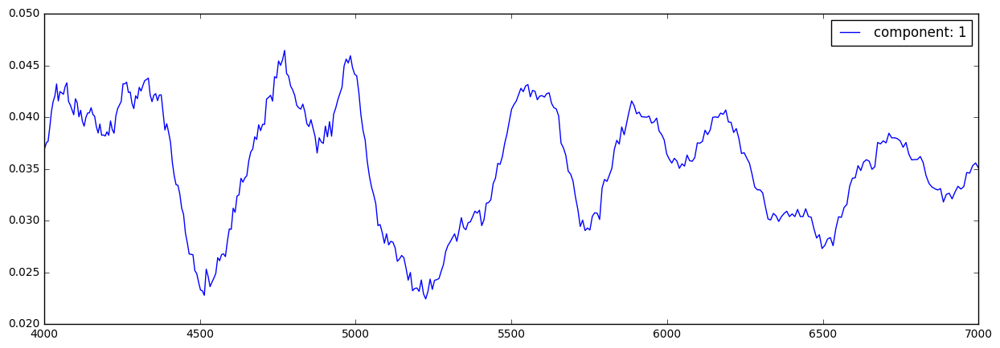

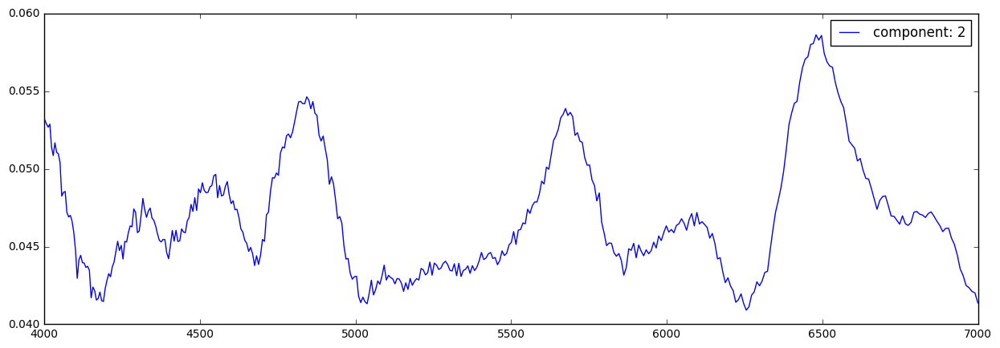

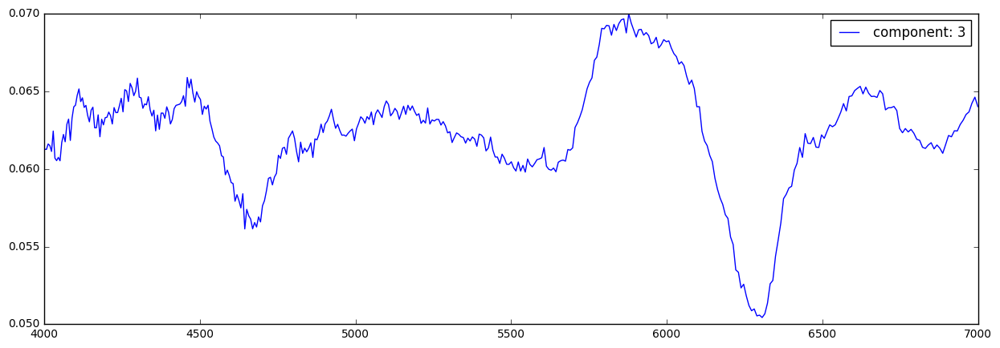

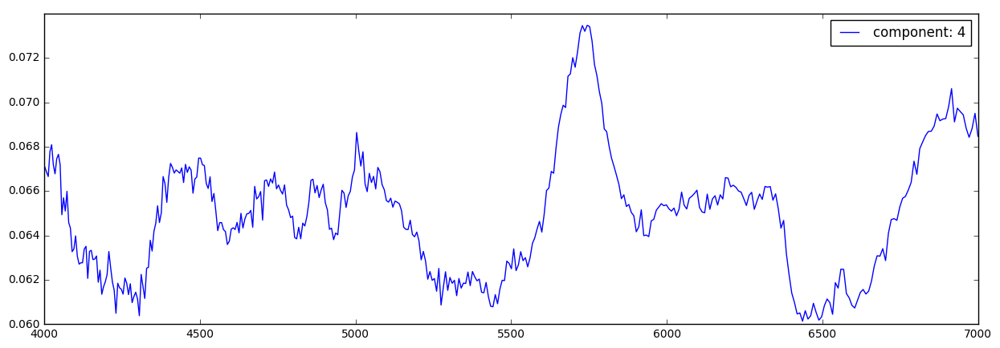

...

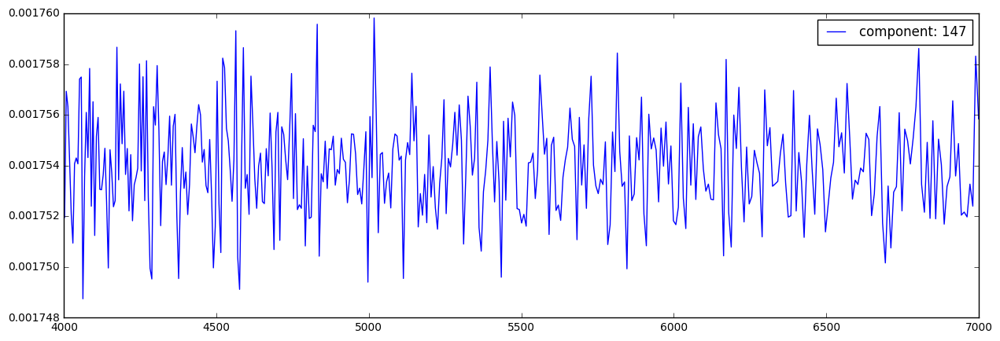

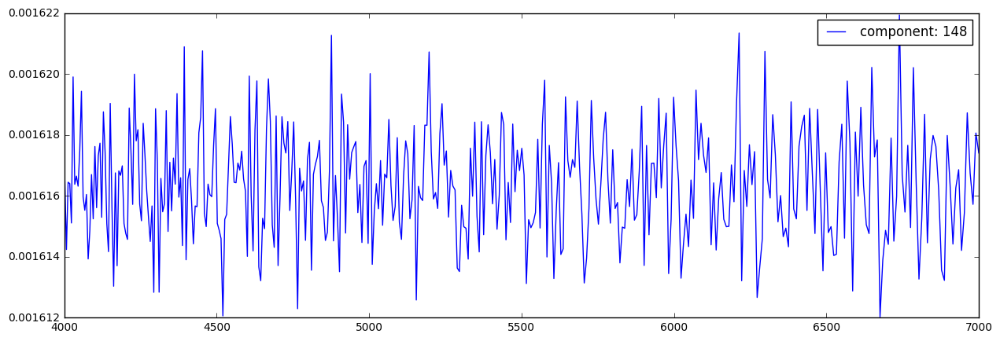

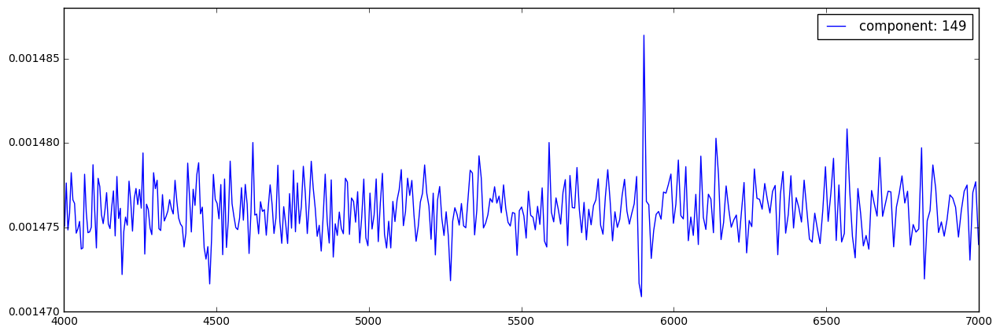

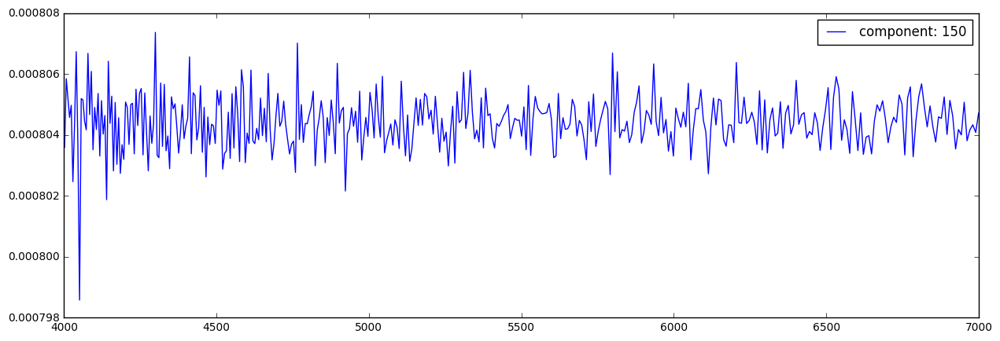

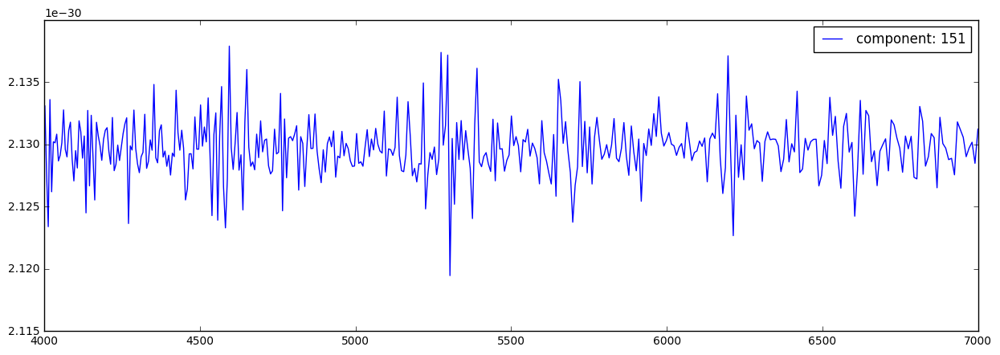

In [78]:
evecs = pca.components_
evals = pca.explained_variance_ratio_
evals_cs = evals.cumsum()

for i,ev in enumerate(evecs):
    plt.figure(figsize=(15,5))
    plt.plot(wavelengths,evals[i]*(ev+i*0.3), label="component: %d"%i)
    plt.legend(fontsize=12)

In [77]:
evals_cs

array([ 0.23842068,  0.35685997,  0.43497803,  0.50426857,  0.55837702,
        0.59636803,  0.62927415,  0.65297666,  0.67323912,  0.69101311,
        0.70822581,  0.72251195,  0.7361804 ,  0.74870255,  0.76076606,
        0.77168466,  0.78217904,  0.79184345,  0.80084037,  0.80950973,
        0.81718203,  0.82412498,  0.83073412,  0.83702423,  0.84291578,
        0.84847246,  0.85381687,  0.85881291,  0.86372836,  0.86853288,
        0.87289967,  0.87714019,  0.8812948 ,  0.88528162,  0.88897686,
        0.89263967,  0.89614901,  0.89959003,  0.90293729,  0.90615912,
        0.90924486,  0.91231292,  0.91522992,  0.91807826,  0.92079119,
        0.9234322 ,  0.92600697,  0.92848298,  0.93090838,  0.93317874,
        0.93539357,  0.9375659 ,  0.93970873,  0.94175195,  0.94371067,
        0.94561468,  0.94750368,  0.94934679,  0.95110164,  0.95279303,
        0.95446347,  0.95607515,  0.95762074,  0.95914971,  0.9605877 ,
        0.96198327,  0.96332814,  0.96464199,  0.96591882,  0.96